In [1]:
library(Seurat)
library(ggplot2)

Attaching SeuratObject



In [2]:
obj_adult = readRDS("/data/input/Files/FB_data/scRNA_FB_20240703/Adult_FB_fig1_merge_harmony.rds")
obj_adult

An object of class Seurat 
27707 features across 15156 samples within 1 assay 
Active assay: RNA (27707 features, 3000 variable features)
 3 dimensional reductions calculated: pca, harmony, umap

In [3]:
obj_ep = readRDS("/data/input/Files/FB_data/scRNA_FB_20240703/EP_FB_fig1_merge_harmony.rds")
obj_ep

An object of class Seurat 
28053 features across 287933 samples within 1 assay 
Active assay: RNA (28053 features, 3000 variable features)
 3 dimensional reductions calculated: pca, harmony, umap

In [4]:
ms_adult = read.csv("/data/input/Files/ResultData/Notebook/wangshuai3/output/E-SCT20230901002/20240705180344/Adult_modulescore.csv.gz", row.names=1)
head(ms_adult)

,extracellular.matrix.organization,extracellular.matrix.organization.papillary.,extracellular.matrix.organization.reticular.,extracellular.matrix.organization.fascia.,extracellular.matrix.organization.myofibroblast.,cell.chemotaxis,regulation.of.inflammatory.response,regulation.of.fibroblast.apoptotic.process,intrinsic.apoptotic.signaling.pathway.by.p53.class.mediator,TRAIL.activated.apoptotic.signaling.pathway,apoptotic.process.FB.TRAIL.p53.,response.to.oxidative.stress,actin.filament.organization
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
RNA_r_Adult_10D_F1_1_2_CELL4_N1,0.5168886,0.5083074,0.7308392,0.7843618,0.6709947,0.27797425,0.250757633,0.068981149,0.08380710,0.04340501,0.09534868,0.3165302,0.1967821
RNA_r_Adult_10D_F1_1_2_CELL30_N2,0.4670443,0.4001990,0.6426649,0.4087137,0.8387252,0.06257458,0.213359909,-0.142785365,0.07882343,0.28639087,0.07312799,0.3182285,0.1513694
RNA_r_Adult_10D_F1_1_2_CELL36_N1,0.5718862,0.6158471,0.8329972,0.6520465,1.1960640,0.04550318,0.204827053,-0.309148585,0.13219112,0.05291062,0.05196926,0.3103000,0.1496837
RNA_r_Adult_10D_F1_1_2_CELL45_N2,0.5555176,0.5796849,0.6221489,0.4181497,1.3757885,-0.02824125,0.006713636,-0.324771524,-0.07936047,0.05339112,-0.10039822,0.1922344,0.2225704
RNA_r_Adult_10D_F1_1_2_CELL46_N4,0.4437364,0.4296287,0.7129377,0.6341905,0.3528680,0.20452770,0.214822655,-0.002235198,0.06916544,0.02070799,0.06582310,0.3407879,0.1031438
RNA_r_Adult_10D_F1_1_2_CELL48_N3,0.4663694,0.4877054,1.0203753,0.5803044,0.2612356,0.16414623,0.220873520,0.234280110,0.06815420,0.03100169,0.11853865,0.3239146,0.1326563


In [5]:
ms_ep = read.csv("/data/input/Files/ResultData/Notebook/wangshuai3/output/E-SCT20230901002/20240705180344/EP_modulescore.csv.gz", row.names=1)
head(ms_ep)

,extracellular.matrix.organization,extracellular.matrix.organization.papillary.,extracellular.matrix.organization.reticular.,extracellular.matrix.organization.fascia.,extracellular.matrix.organization.myofibroblast.,cell.chemotaxis,regulation.of.inflammatory.response,regulation.of.fibroblast.apoptotic.process,intrinsic.apoptotic.signaling.pathway.by.p53.class.mediator,TRAIL.activated.apoptotic.signaling.pathway,apoptotic.process.FB.TRAIL.p53.,response.to.oxidative.stress,actin.filament.organization
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
RNA_r_E16.5_1D_AC2_1_2_CELL1_N1,0.18061147,0.06132686,0.28602957,0.08813446,0.26767594,0.01219852,-0.048099541,0.005010348,-0.01809276,-0.22711797,-0.05345699,0.10949319,0.06113764
RNA_r_E16.5_1D_AC2_1_2_CELL2_N1,0.04738145,0.11354633,-0.12562829,-0.07065421,-0.05344146,-0.14219016,-0.079579316,-0.112084998,0.07046447,-0.60410767,-0.10611382,0.15938644,0.00664280
RNA_r_E16.5_1D_AC2_1_2_CELL3_N1,0.18740499,0.12815765,0.05593298,0.03645998,0.33530959,-0.12630733,-0.007976478,0.343634439,0.22379330,-0.16351980,0.15842904,0.13378336,0.06350124
RNA_r_E16.5_1D_AC2_1_2_CELL6_N1,0.15430771,0.13302002,0.10862516,0.07581985,0.21913317,-0.03063312,-0.070705017,-0.032479873,0.31092391,-0.07934200,0.16833575,0.06533578,0.04917873
RNA_r_E16.5_1D_AC2_1_2_CELL8_N1,0.16641392,0.20262003,0.08115008,0.12457425,0.29409637,-0.09565380,-0.053835223,-0.168856116,0.23449448,0.07091814,0.14991445,0.08454860,-0.04682392
RNA_r_E16.5_1D_AC2_1_2_CELL9_N1,0.50432257,0.32825536,0.34970177,0.97163877,0.59296680,0.02467932,0.041856409,0.132385934,0.10490262,0.45048171,0.18366966,0.14910720,0.25437601


In [6]:
obj_adult@meta.data = cbind(obj_adult@meta.data, ms_adult)
colnames(ms_adult)

[1] "extracellular.matrix.organization"                          
 [2] "extracellular.matrix.organization.papillary."               
 [3] "extracellular.matrix.organization.reticular."               
 [4] "extracellular.matrix.organization.fascia."                  
 [5] "extracellular.matrix.organization.myofibroblast."           
 [6] "cell.chemotaxis"                                            
 [7] "regulation.of.inflammatory.response"                        
 [8] "regulation.of.fibroblast.apoptotic.process"                 
 [9] "intrinsic.apoptotic.signaling.pathway.by.p53.class.mediator"
[10] "TRAIL.activated.apoptotic.signaling.pathway"                
[11] "apoptotic.process.FB.TRAIL.p53."                            
[12] "response.to.oxidative.stress"                               
[13] "actin.filament.organization"

In [7]:
obj_ep@meta.data = cbind(obj_ep@meta.data, ms_ep)
colnames(ms_ep)

[1] "extracellular.matrix.organization"                          
 [2] "extracellular.matrix.organization.papillary."               
 [3] "extracellular.matrix.organization.reticular."               
 [4] "extracellular.matrix.organization.fascia."                  
 [5] "extracellular.matrix.organization.myofibroblast."           
 [6] "cell.chemotaxis"                                            
 [7] "regulation.of.inflammatory.response"                        
 [8] "regulation.of.fibroblast.apoptotic.process"                 
 [9] "intrinsic.apoptotic.signaling.pathway.by.p53.class.mediator"
[10] "TRAIL.activated.apoptotic.signaling.pathway"                
[11] "apoptotic.process.FB.TRAIL.p53."                            
[12] "response.to.oxidative.stress"                               
[13] "actin.filament.organization"

In [8]:
dir.create("/data/output/Fig2S_scRNA_ModuleScore")

Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.
Saving 6.67 x 6.67 in image


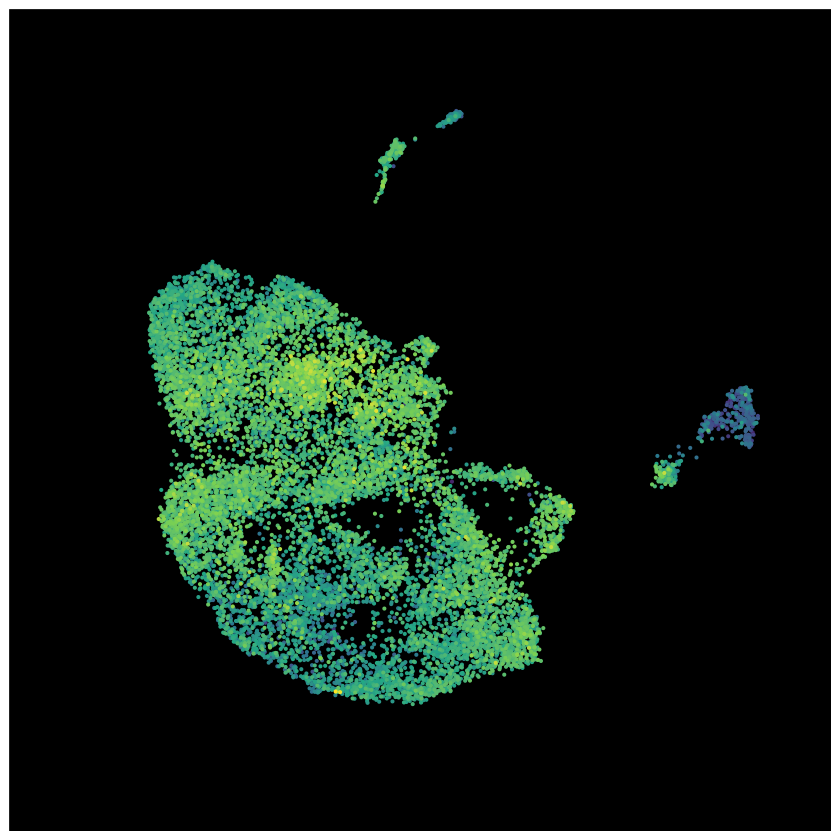

In [9]:
i = "extracellular.matrix.organization"

p <- FeaturePlot(obj_adult, features=i,raster=F, order=T)  + scale_colour_viridis_c(option="D") + 
      theme(axis.text.x = element_text(),
            axis.text.y = element_text(),  #设置 y 轴标签颜色为白色
            plot.background = element_rect(fill = "black"),   #将整个图形背景颜色改为黑色
            panel.background = element_rect(fill = "black"),  #将绘图区域背景颜色改为黑色
            panel.grid.major = element_blank(),  #隐藏主要网格线
            panel.grid.minor = element_blank(),  #隐藏次要网格线
            legend.text = element_text(color = "white")
            ) + NoLegend()

ggsave(paste0("/data/output/Fig2S_scRNA_ModuleScore/Adult_", i, ".png"), p)
p

Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.
Saving 6.67 x 6.67 in image


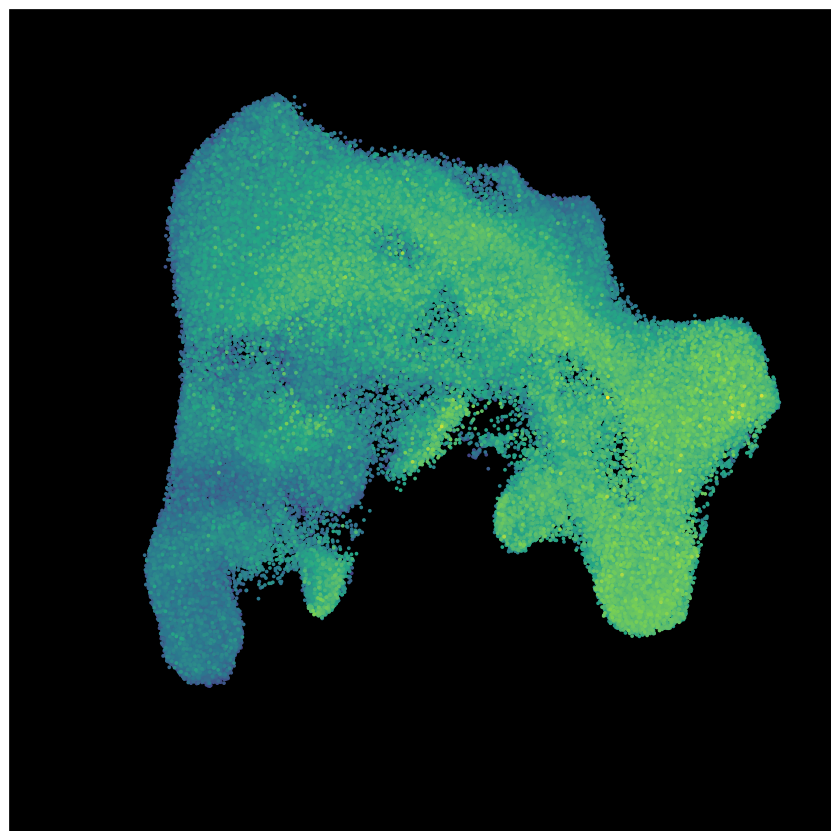

In [10]:
i = "extracellular.matrix.organization"

p <- FeaturePlot(obj_ep, features=i,raster=F, order=T)  + scale_colour_viridis_c(option="D") + 
      theme(axis.text.x = element_text(),
            axis.text.y = element_text(),  #设置 y 轴标签颜色为白色
            plot.background = element_rect(fill = "black"),   #将整个图形背景颜色改为黑色
            panel.background = element_rect(fill = "black"),  #将绘图区域背景颜色改为黑色
            panel.grid.major = element_blank(),  #隐藏主要网格线
            panel.grid.minor = element_blank(),  #隐藏次要网格线
            legend.text = element_text(color = "white")
            )  + NoLegend()

ggsave(paste0("/data/output/Fig2S_scRNA_ModuleScore/EP_", i, ".png"), p)
p

Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.
Saving 6.67 x 6.67 in image


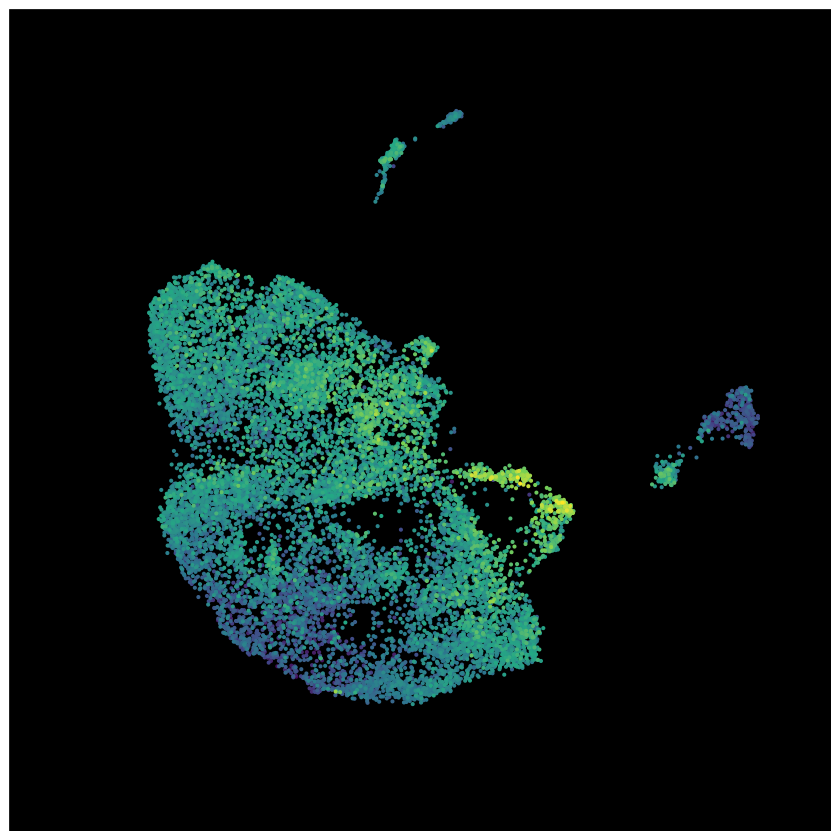

In [11]:
i = "extracellular.matrix.organization.papillary."

p <- FeaturePlot(obj_adult, features=i,raster=F, order=T)  + scale_colour_viridis_c(option="D") + 
      theme(axis.text.x = element_text(),
            axis.text.y = element_text(),  #设置 y 轴标签颜色为白色
            plot.background = element_rect(fill = "black"),   #将整个图形背景颜色改为黑色
            panel.background = element_rect(fill = "black"),  #将绘图区域背景颜色改为黑色
            panel.grid.major = element_blank(),  #隐藏主要网格线
            panel.grid.minor = element_blank(),  #隐藏次要网格线
            legend.text = element_text(color = "white")
            )  + NoLegend()

ggsave(paste0("/data/output/Fig2S_scRNA_ModuleScore/Adult_", i, ".png"), p)
p

Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.
Saving 6.67 x 6.67 in image


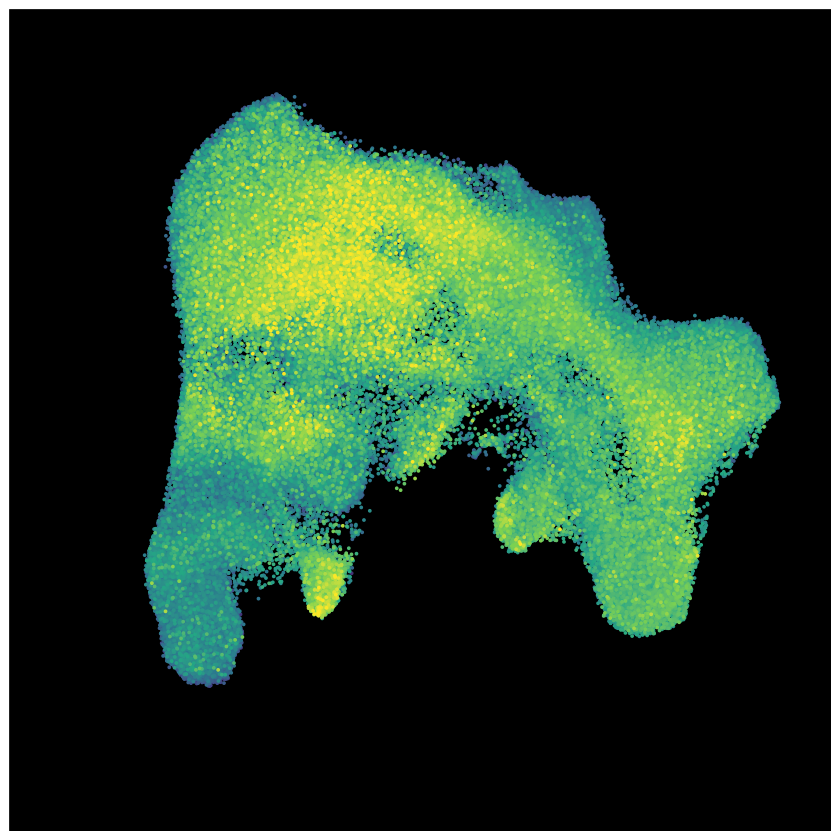

In [12]:
i = "extracellular.matrix.organization.papillary."

p <- FeaturePlot(obj_ep, features=i,raster=F, order=T, max.cutoff=0.9)  + scale_colour_viridis_c(option="D") + 
      theme(axis.text.x = element_text(),
            axis.text.y = element_text(),  #设置 y 轴标签颜色为白色
            plot.background = element_rect(fill = "black"),   #将整个图形背景颜色改为黑色
            panel.background = element_rect(fill = "black"),  #将绘图区域背景颜色改为黑色
            panel.grid.major = element_blank(),  #隐藏主要网格线
            panel.grid.minor = element_blank(),  #隐藏次要网格线
            legend.text = element_text(color = "white")
            )  + NoLegend()

ggsave(paste0("/data/output/Fig2S_scRNA_ModuleScore/EP_", i, ".png"), p)
p

Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.
Saving 6.67 x 6.67 in image


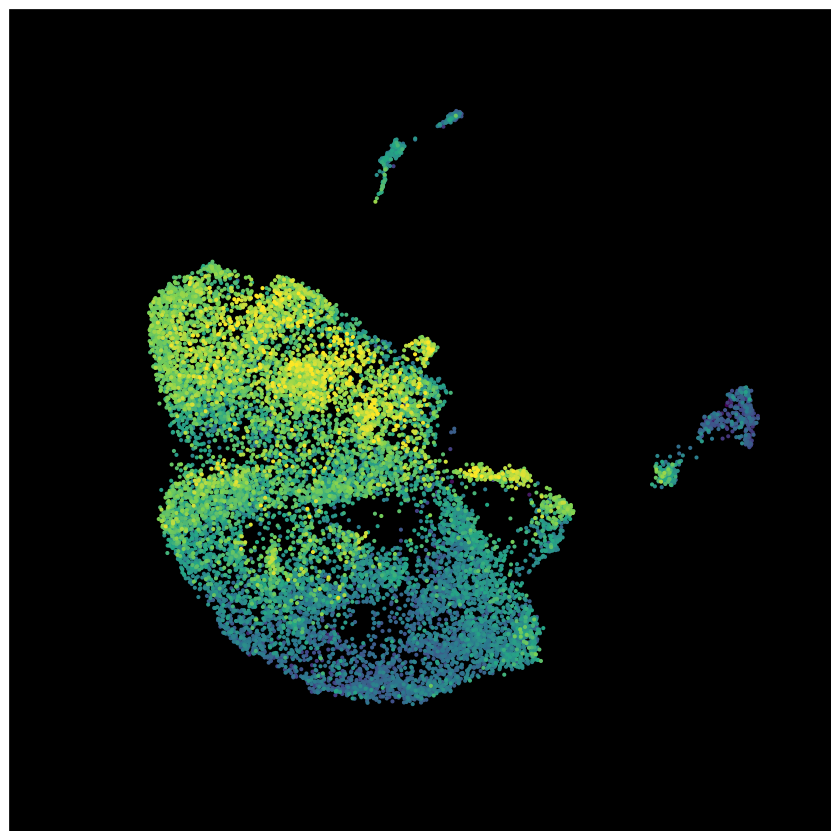

In [13]:
i = "extracellular.matrix.organization.reticular."

p <- FeaturePlot(obj_adult, features=i,raster=F, order=T, max.cutoff=1.6)  + scale_colour_viridis_c(option="D") + 
      theme(axis.text.x = element_text(),
            axis.text.y = element_text(),  #设置 y 轴标签颜色为白色
            plot.background = element_rect(fill = "black"),   #将整个图形背景颜色改为黑色
            panel.background = element_rect(fill = "black"),  #将绘图区域背景颜色改为黑色
            panel.grid.major = element_blank(),  #隐藏主要网格线
            panel.grid.minor = element_blank(),  #隐藏次要网格线
            legend.text = element_text(color = "white")
            ) + NoLegend()

ggsave(paste0("/data/output/Fig2S_scRNA_ModuleScore/Adult_", i, ".png"), p)
p

Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.
Saving 6.67 x 6.67 in image


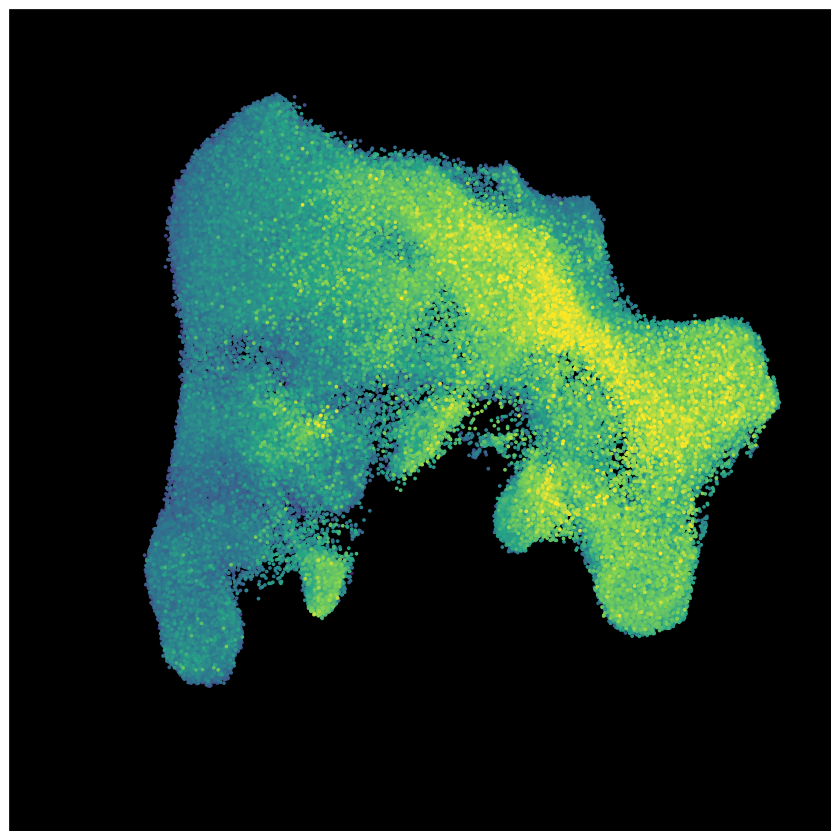

In [14]:
i = "extracellular.matrix.organization.reticular."

p <- FeaturePlot(obj_ep, features=i,raster=F, order=T,  max.cutoff=1.6)  + scale_colour_viridis_c(option="D") + 
      theme(axis.text.x = element_text(),
            axis.text.y = element_text(),  #设置 y 轴标签颜色为白色
            plot.background = element_rect(fill = "black"),   #将整个图形背景颜色改为黑色
            panel.background = element_rect(fill = "black"),  #将绘图区域背景颜色改为黑色
            panel.grid.major = element_blank(),  #隐藏主要网格线
            panel.grid.minor = element_blank(),  #隐藏次要网格线
            legend.text = element_text(color = "white")
            )  + NoLegend()

ggsave(paste0("/data/output/Fig2S_scRNA_ModuleScore/EP_", i, ".png"), p)
p

Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.
Saving 6.67 x 6.67 in image


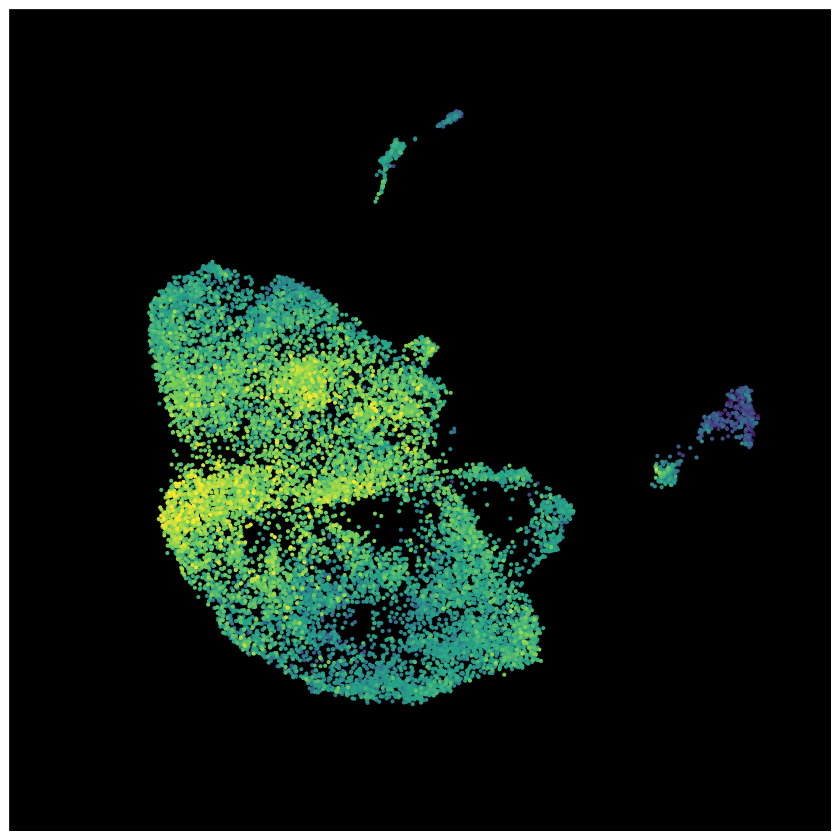

In [15]:
i = "extracellular.matrix.organization.fascia."

p <- FeaturePlot(obj_adult, features=i,raster=F, order=T, max.cutoff=1.1)  + scale_colour_viridis_c(option="D") + 
      theme(axis.text.x = element_text(),
            axis.text.y = element_text(),  #设置 y 轴标签颜色为白色
            plot.background = element_rect(fill = "black"),   #将整个图形背景颜色改为黑色
            panel.background = element_rect(fill = "black"),  #将绘图区域背景颜色改为黑色
            panel.grid.major = element_blank(),  #隐藏主要网格线
            panel.grid.minor = element_blank(),  #隐藏次要网格线
            legend.text = element_text(color = "white")
            ) +NoLegend()

ggsave(paste0("/data/output/Fig2S_scRNA_ModuleScore/Adult_", i, ".png"), p)
p

Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.
Saving 6.67 x 6.67 in image


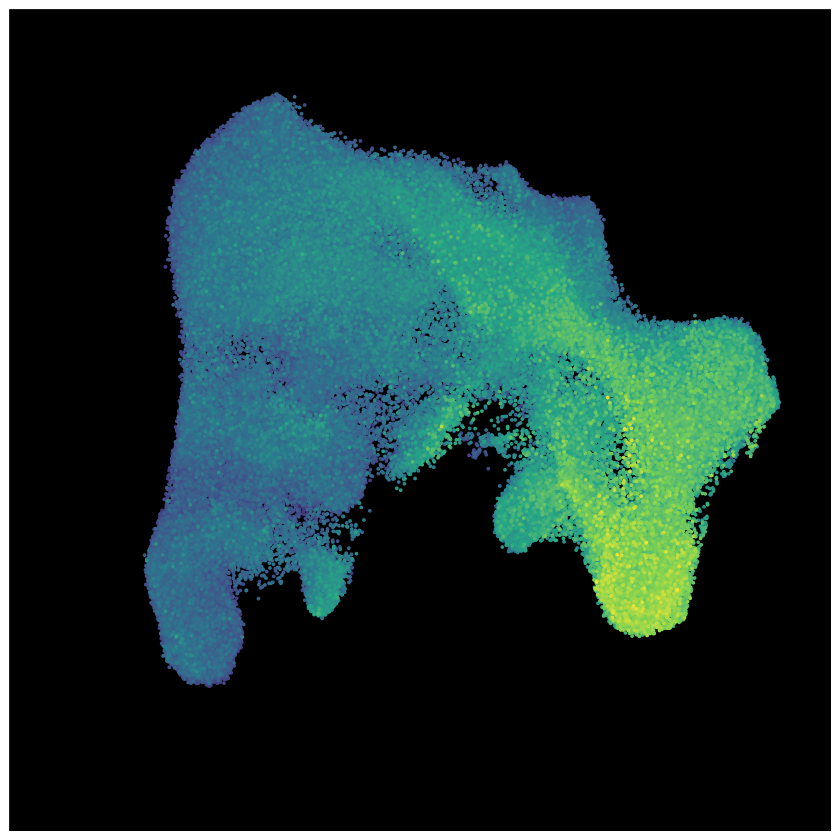

In [16]:
i = "extracellular.matrix.organization.fascia."

p <- FeaturePlot(obj_ep, features=i,raster=F, order=T)  + scale_colour_viridis_c(option="D") + 
      theme(axis.text.x = element_text(),
            axis.text.y = element_text(),  #设置 y 轴标签颜色为白色
            plot.background = element_rect(fill = "black"),   #将整个图形背景颜色改为黑色
            panel.background = element_rect(fill = "black"),  #将绘图区域背景颜色改为黑色
            panel.grid.major = element_blank(),  #隐藏主要网格线
            panel.grid.minor = element_blank(),  #隐藏次要网格线
            legend.text = element_text(color = "white")
            )  + NoLegend()

ggsave(paste0("/data/output/Fig2S_scRNA_ModuleScore/EP_", i, ".png"), p)
p

Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.
Saving 6.67 x 6.67 in image


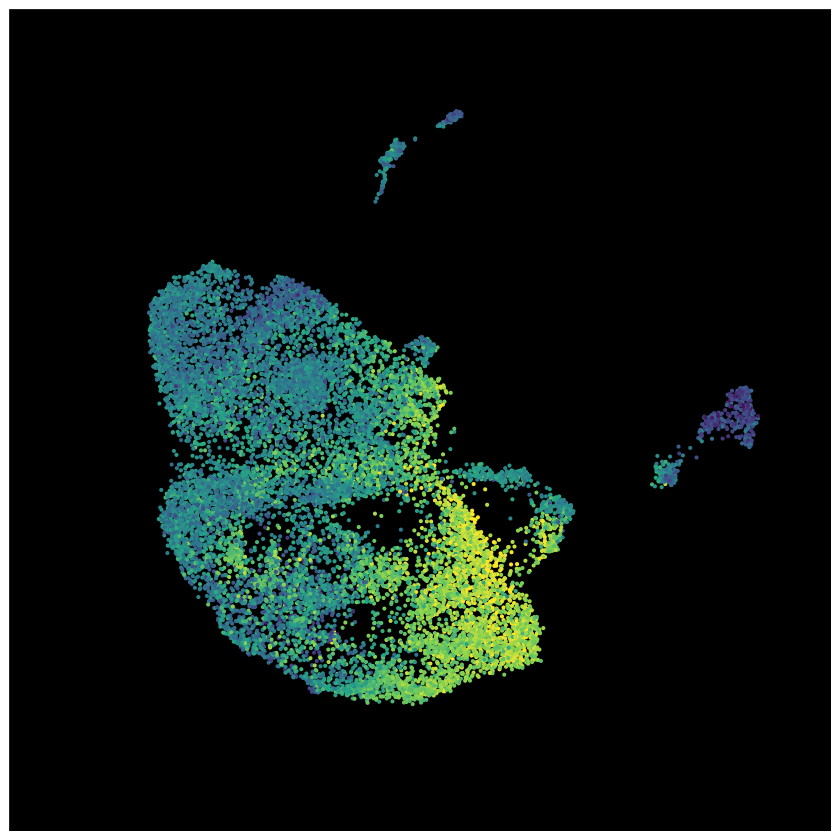

In [34]:
i = "extracellular.matrix.organization.myofibroblast."

p <- FeaturePlot(obj_adult, features=i,raster=F, max.cutoff=1.2)  + scale_colour_viridis_c(option="D") + 
      theme(axis.text.x = element_text(),
            axis.text.y = element_text(),  #设置 y 轴标签颜色为白色
            plot.background = element_rect(fill = "black"),   #将整个图形背景颜色改为黑色
            panel.background = element_rect(fill = "black"),  #将绘图区域背景颜色改为黑色
            panel.grid.major = element_blank(),  #隐藏主要网格线
            panel.grid.minor = element_blank(),  #隐藏次要网格线
            legend.text = element_text(color = "white")
            )  + NoLegend()

ggsave(paste0("/data/output/Fig2S_scRNA_ModuleScore/Adult_", i, ".png"), p)
p

Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.
Saving 6.67 x 6.67 in image


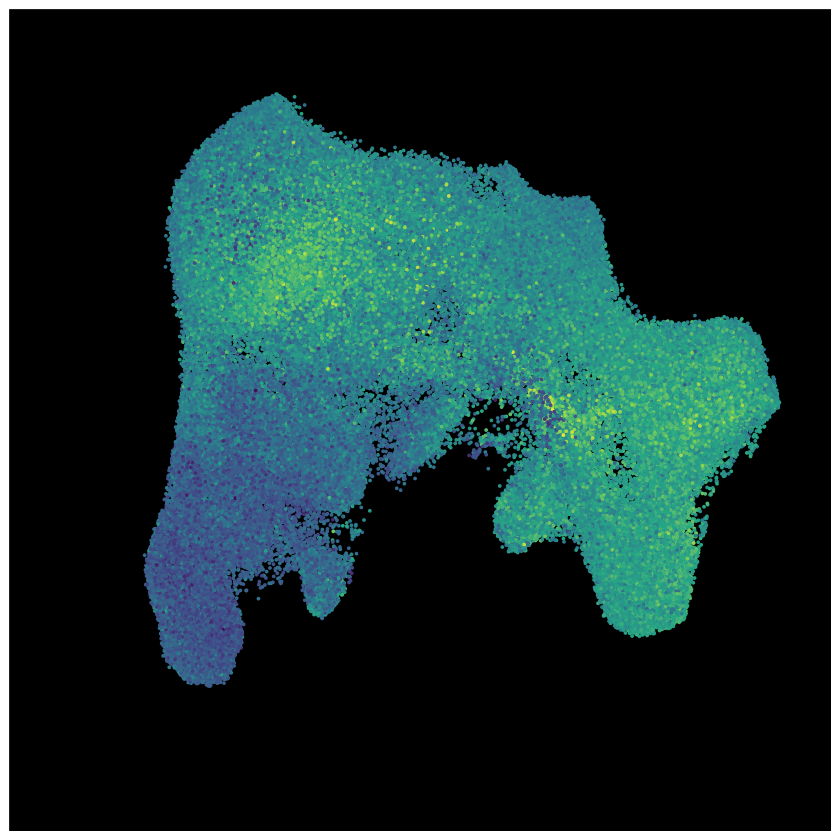

In [33]:
i = "extracellular.matrix.organization.myofibroblast."

p <- FeaturePlot(obj_ep, features=i,raster=F)  + scale_colour_viridis_c(option="D") + 
      theme(axis.text.x = element_text(),
            axis.text.y = element_text(),  #设置 y 轴标签颜色为白色
            plot.background = element_rect(fill = "black"),   #将整个图形背景颜色改为黑色
            panel.background = element_rect(fill = "black"),  #将绘图区域背景颜色改为黑色
            panel.grid.major = element_blank(),  #隐藏主要网格线
            panel.grid.minor = element_blank(),  #隐藏次要网格线
            legend.text = element_text(color = "white")
            )   + NoLegend()

ggsave(paste0("/data/output/Fig2S_scRNA_ModuleScore/EP_", i, ".png"), p)
p

In [30]:
colnames(ms_adult)

[1] "extracellular.matrix.organization"                          
 [2] "extracellular.matrix.organization.papillary."               
 [3] "extracellular.matrix.organization.reticular."               
 [4] "extracellular.matrix.organization.fascia."                  
 [5] "extracellular.matrix.organization.myofibroblast."           
 [6] "cell.chemotaxis"                                            
 [7] "regulation.of.inflammatory.response"                        
 [8] "regulation.of.fibroblast.apoptotic.process"                 
 [9] "intrinsic.apoptotic.signaling.pathway.by.p53.class.mediator"
[10] "TRAIL.activated.apoptotic.signaling.pathway"                
[11] "apoptotic.process.FB.TRAIL.p53."                            
[12] "response.to.oxidative.stress"                               
[13] "actin.filament.organization"

Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.
Saving 6.67 x 6.67 in image


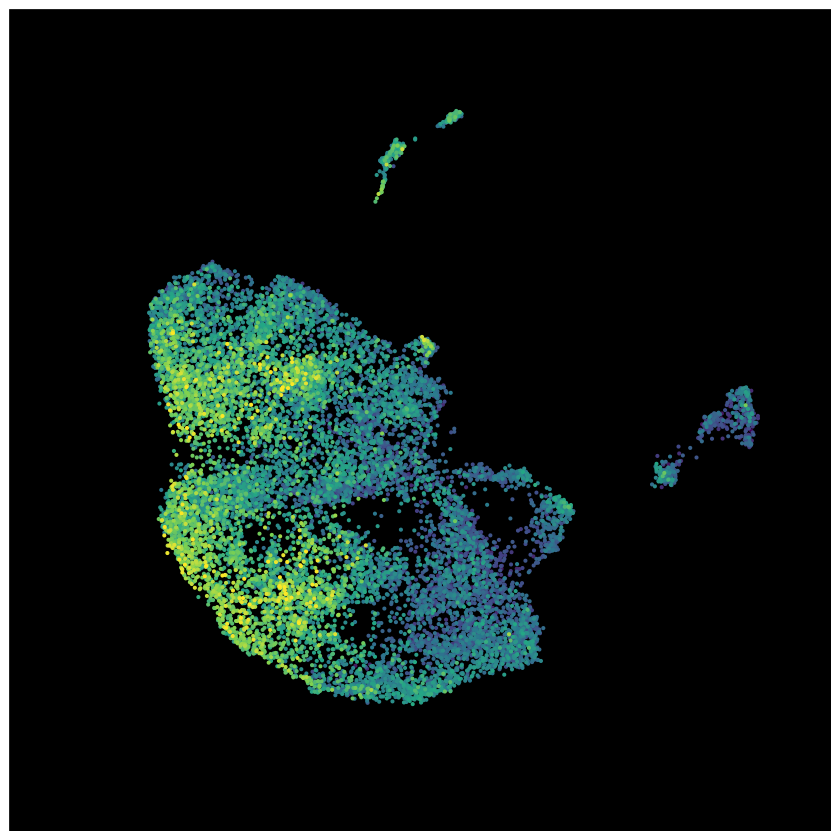

In [ ]:
i = "cell.chemotaxis"

p <- FeaturePlot(obj_adult, features=i,raster=F, order=T, max.cutoff=0.6)  + scale_colour_viridis_c(option="D") + 
      theme(axis.text.x = element_text(),
            axis.text.y = element_text(),  #设置 y 轴标签颜色为白色
            plot.background = element_rect(fill = "black"),   #将整个图形背景颜色改为黑色
            panel.background = element_rect(fill = "black"),  #将绘图区域背景颜色改为黑色
            panel.grid.major = element_blank(),  #隐藏主要网格线
            panel.grid.minor = element_blank(),  #隐藏次要网格线
            legend.text = element_text(color = "white")
            ) +NoLegend()

ggsave(paste0("/data/output/Fig2S_scRNA_ModuleScore/Adult_", i, ".png"), p)
p

Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.
Saving 6.67 x 6.67 in image


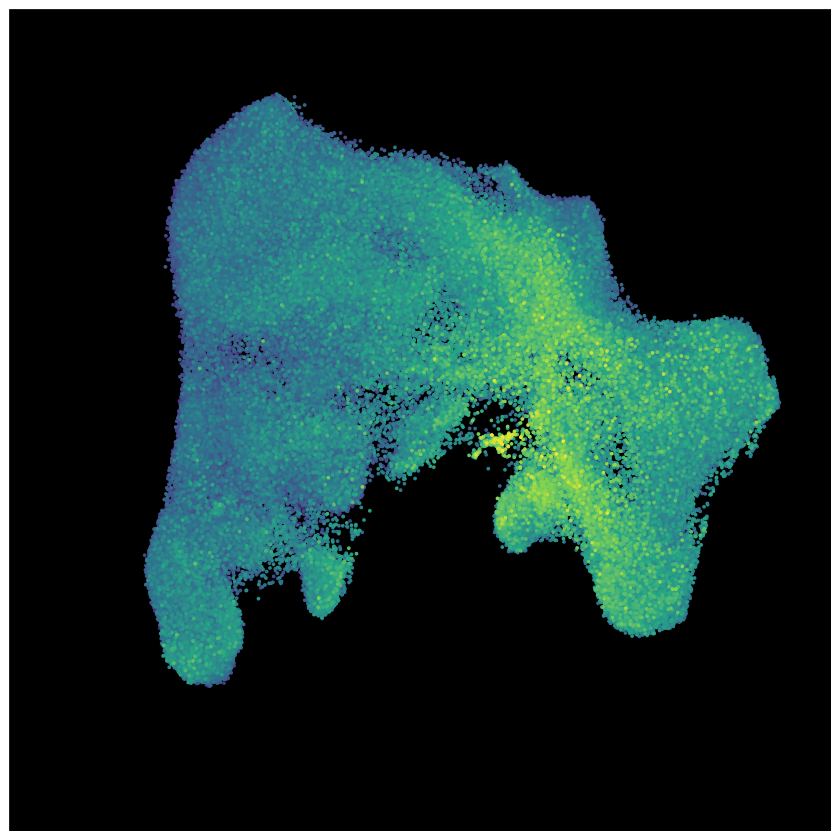

In [32]:
i = "cell.chemotaxis"

p <- FeaturePlot(obj_ep, features=i,raster=F,order=T,max.cutoff=0.6)  + scale_colour_viridis_c(option="D") + 
      theme(axis.text.x = element_text(),
            axis.text.y = element_text(),  #设置 y 轴标签颜色为白色
            plot.background = element_rect(fill = "black"),   #将整个图形背景颜色改为黑色
            panel.background = element_rect(fill = "black"),  #将绘图区域背景颜色改为黑色
            panel.grid.major = element_blank(),  #隐藏主要网格线
            panel.grid.minor = element_blank(),  #隐藏次要网格线
            legend.text = element_text(color = "white")
            )   + NoLegend()

ggsave(paste0("/data/output/Fig2S_scRNA_ModuleScore/EP_", i, ".png"), p)
p

Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.
Saving 6.67 x 6.67 in image


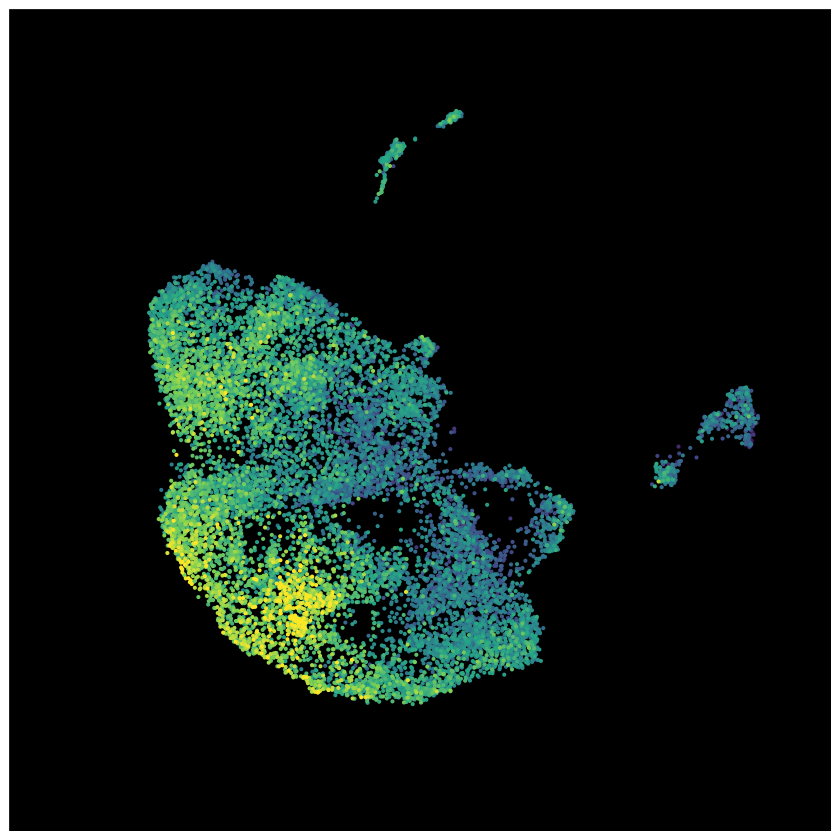

In [ ]:
i = "regulation.of.inflammatory.response"

p <- FeaturePlot(obj_adult, features=i,raster=F, order=T,max.cutoff=0.6)  + scale_colour_viridis_c(option="D") + 
      theme(axis.text.x = element_text(),
            axis.text.y = element_text(),  #设置 y 轴标签颜色为白色
            plot.background = element_rect(fill = "black"),   #将整个图形背景颜色改为黑色
            panel.background = element_rect(fill = "black"),  #将绘图区域背景颜色改为黑色
            panel.grid.major = element_blank(),  #隐藏主要网格线
            panel.grid.minor = element_blank(),  #隐藏次要网格线
            legend.text = element_text(color = "white")
            )  +NoLegend()

ggsave(paste0("/data/output/Fig2S_scRNA_ModuleScore/Adult_", i, ".png"), p)
p

Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.
Saving 6.67 x 6.67 in image


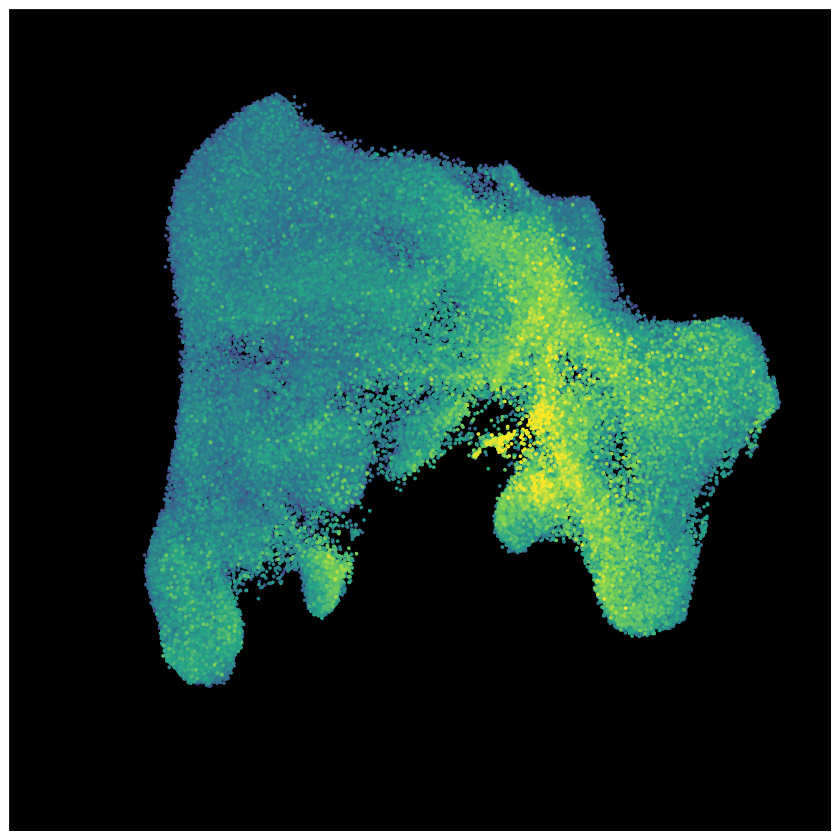

In [ ]:
i = "regulation.of.inflammatory.response"

p <- FeaturePlot(obj_ep, features=i,raster=F,order=T,max.cutoff=0.6)  + scale_colour_viridis_c(option="D") + 
      theme(axis.text.x = element_text(),
            axis.text.y = element_text(),  #设置 y 轴标签颜色为白色
            plot.background = element_rect(fill = "black"),   #将整个图形背景颜色改为黑色
            panel.background = element_rect(fill = "black"),  #将绘图区域背景颜色改为黑色
            panel.grid.major = element_blank(),  #隐藏主要网格线
            panel.grid.minor = element_blank(),  #隐藏次要网格线
            legend.text = element_text(color = "white")
            )   + NoLegend()

ggsave(paste0("/data/output/Fig2S_scRNA_ModuleScore/EP_", i, ".png"), p)
p

Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.
Saving 6.67 x 6.67 in image


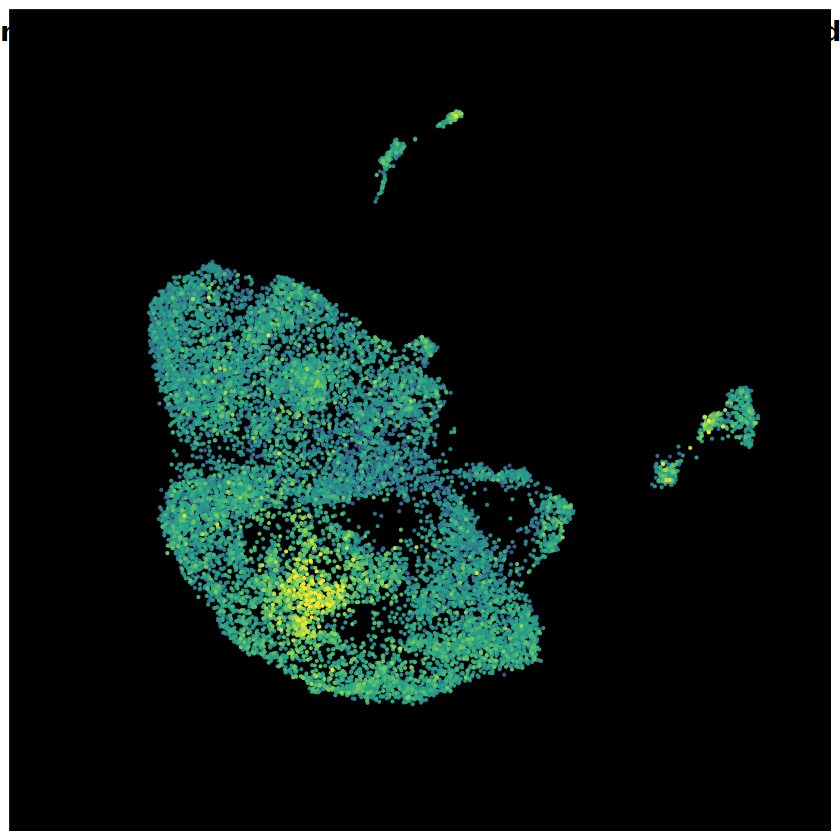

In [ ]:
i = "intrinsic.apoptotic.signaling.pathway.by.p53.class.mediator"

p <- FeaturePlot(obj_adult, features=i,raster=F, order=T, max.cutoff=0.6)  + scale_colour_viridis_c(option="D") + 
      theme(axis.text.x = element_text(),
            axis.text.y = element_text(),  #设置 y 轴标签颜色为白色
            plot.background = element_rect(fill = "black"),   #将整个图形背景颜色改为黑色
            panel.background = element_rect(fill = "black"),  #将绘图区域背景颜色改为黑色
            panel.grid.major = element_blank(),  #隐藏主要网格线
            panel.grid.minor = element_blank(),  #隐藏次要网格线
            legend.text = element_text(color = "white")
            )  +NoLegend()

ggsave(paste0("/data/output/Fig2S_scRNA_ModuleScore/Adult_", i, ".png"), p)
p

Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.
Saving 6.67 x 6.67 in image


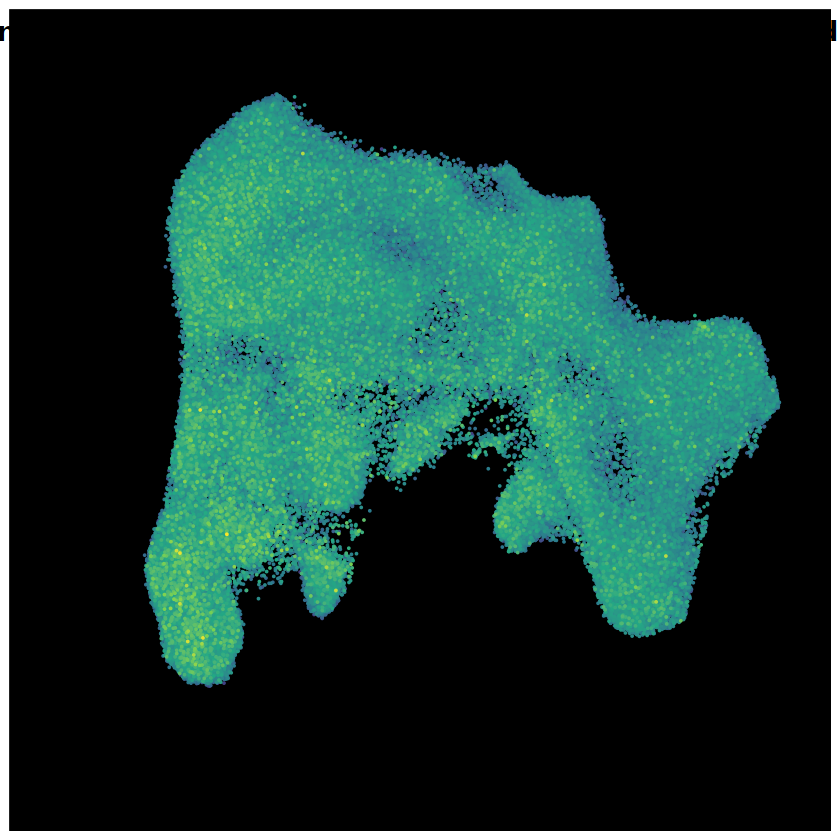

In [ ]:
i = "intrinsic.apoptotic.signaling.pathway.by.p53.class.mediator"

p <- FeaturePlot(obj_ep, features=i,raster=F,order=T)  + scale_colour_viridis_c(option="D") + 
      theme(axis.text.x = element_text(),
            axis.text.y = element_text(),  #设置 y 轴标签颜色为白色
            plot.background = element_rect(fill = "black"),   #将整个图形背景颜色改为黑色
            panel.background = element_rect(fill = "black"),  #将绘图区域背景颜色改为黑色
            panel.grid.major = element_blank(),  #隐藏主要网格线
            panel.grid.minor = element_blank(),  #隐藏次要网格线
            legend.text = element_text(color = "white")
            )  + NoLegend()

ggsave(paste0("/data/output/Fig2S_scRNA_ModuleScore/EP_", i, ".png"), p)
p

Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.
Saving 6.67 x 6.67 in image


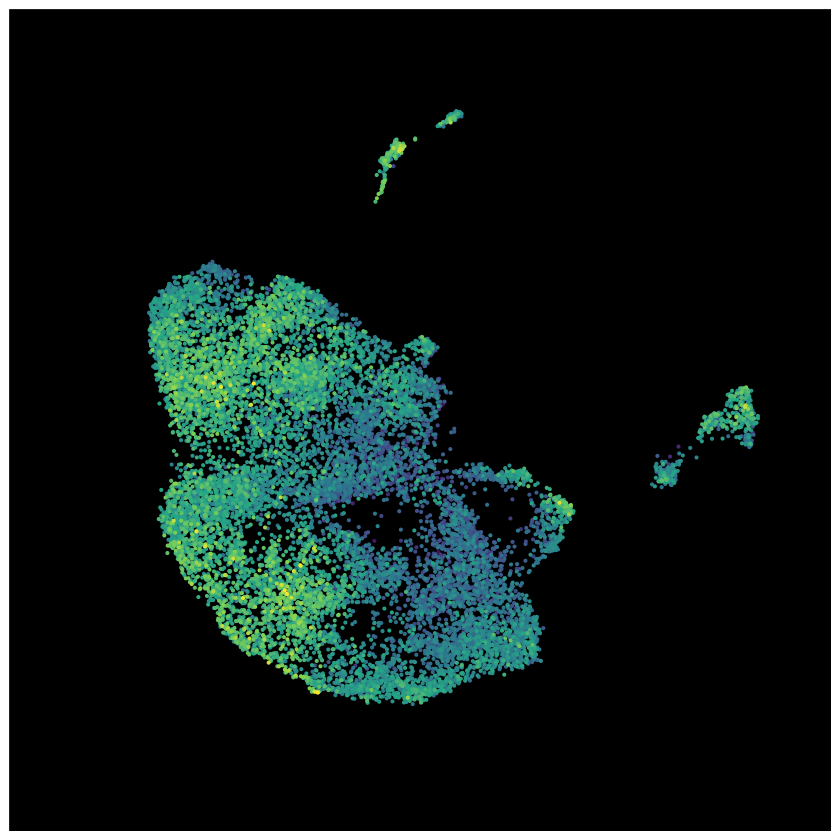

In [ ]:
i = "response.to.oxidative.stress"

p <- FeaturePlot(obj_adult, features=i,raster=F, order=T, max.cutoff=0.65)  + scale_colour_viridis_c(option="D") + 
      theme(axis.text.x = element_text(),
            axis.text.y = element_text(),  #设置 y 轴标签颜色为白色
            plot.background = element_rect(fill = "black"),   #将整个图形背景颜色改为黑色
            panel.background = element_rect(fill = "black"),  #将绘图区域背景颜色改为黑色
            panel.grid.major = element_blank(),  #隐藏主要网格线
            panel.grid.minor = element_blank(),  #隐藏次要网格线
            legend.text = element_text(color = "white")
            ) +NoLegend()

ggsave(paste0("/data/output/Fig2S_scRNA_ModuleScore/Adult_", i, ".png"), p)
p

Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.
Saving 6.67 x 6.67 in image


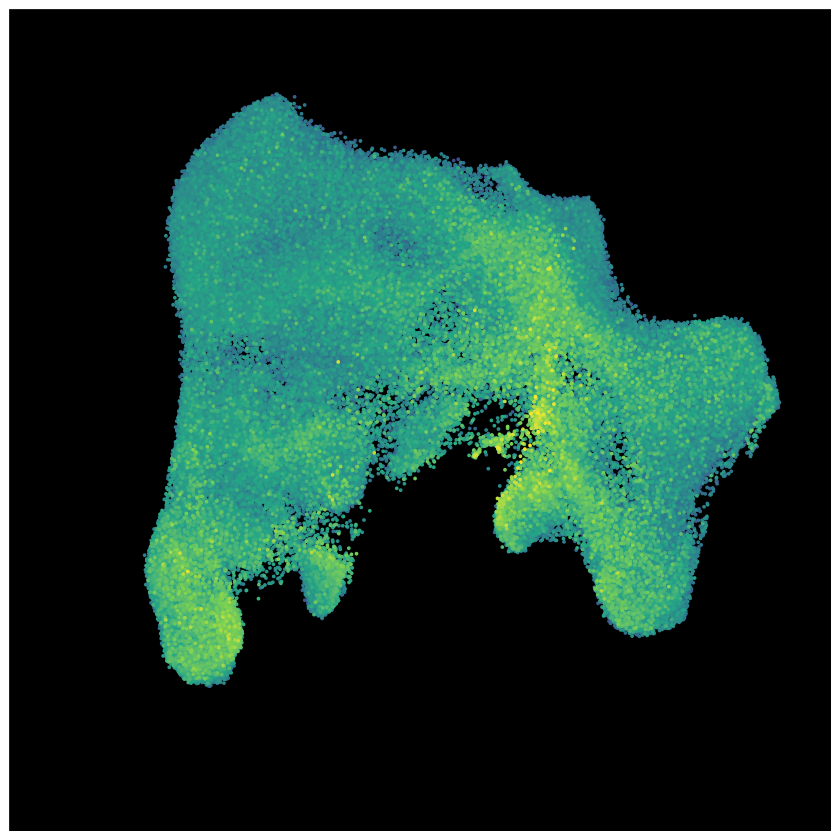

In [31]:
i = "response.to.oxidative.stress"

p <- FeaturePlot(obj_ep, features=i,raster=F,order=T, max.cutoff=0.65)  + scale_colour_viridis_c(option="D") + 
      theme(axis.text.x = element_text(),
            axis.text.y = element_text(),  #设置 y 轴标签颜色为白色
            plot.background = element_rect(fill = "black"),   #将整个图形背景颜色改为黑色
            panel.background = element_rect(fill = "black"),  #将绘图区域背景颜色改为黑色
            panel.grid.major = element_blank(),  #隐藏主要网格线
            panel.grid.minor = element_blank(),  #隐藏次要网格线
            legend.text = element_text(color = "white")
            )  + NoLegend()

ggsave(paste0("/data/output/Fig2S_scRNA_ModuleScore/EP_", i, ".png"), p)
p

Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.
Saving 6.67 x 6.67 in image


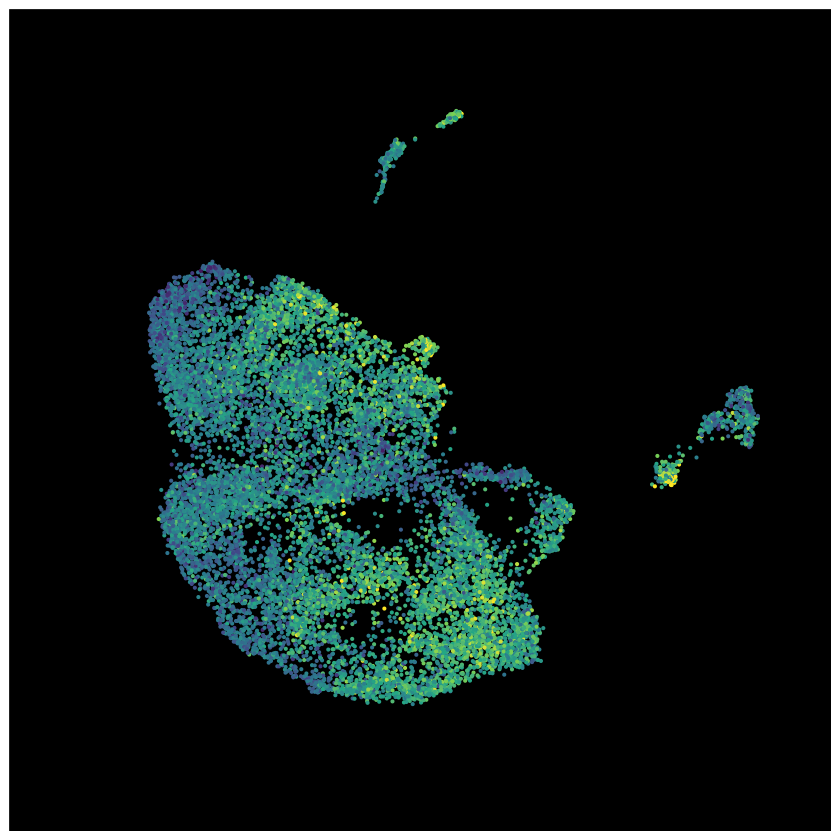

In [ ]:
i = "actin.filament.organization"

p <- FeaturePlot(obj_adult, features=i,raster=F,max.cutoff=0.35)  + scale_colour_viridis_c(option="D") + 
      theme(axis.text.x = element_text(),
            axis.text.y = element_text(),  #设置 y 轴标签颜色为白色
            plot.background = element_rect(fill = "black"),   #将整个图形背景颜色改为黑色
            panel.background = element_rect(fill = "black"),  #将绘图区域背景颜色改为黑色
            panel.grid.major = element_blank(),  #隐藏主要网格线
            panel.grid.minor = element_blank(),  #隐藏次要网格线
            legend.text = element_text(color = "white")
            ) +NoLegend()

ggsave(paste0("/data/output/Fig2S_scRNA_ModuleScore/Adult_", i, ".png"), p)
p

Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.
Saving 6.67 x 6.67 in image


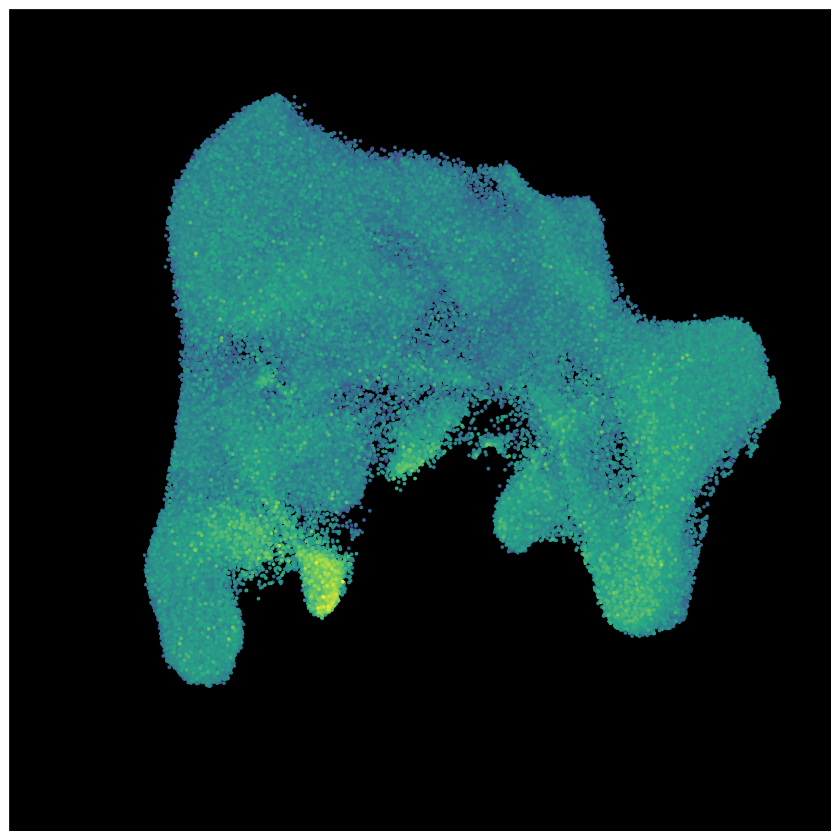

In [ ]:
i = "actin.filament.organization"

p <- FeaturePlot(obj_ep, features=i,raster=F,order=T)  + scale_colour_viridis_c(option="D") + 
      theme(axis.text.x = element_text(),
            axis.text.y = element_text(),  #设置 y 轴标签颜色为白色
            plot.background = element_rect(fill = "black"),   #将整个图形背景颜色改为黑色
            panel.background = element_rect(fill = "black"),  #将绘图区域背景颜色改为黑色
            panel.grid.major = element_blank(),  #隐藏主要网格线
            panel.grid.minor = element_blank(),  #隐藏次要网格线
            legend.text = element_text(color = "white")
            )  + NoLegend()

ggsave(paste0("/data/output/Fig2S_scRNA_ModuleScore/EP_", i, ".png"), p)
p

Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.
Saving 6.67 x 6.67 in image


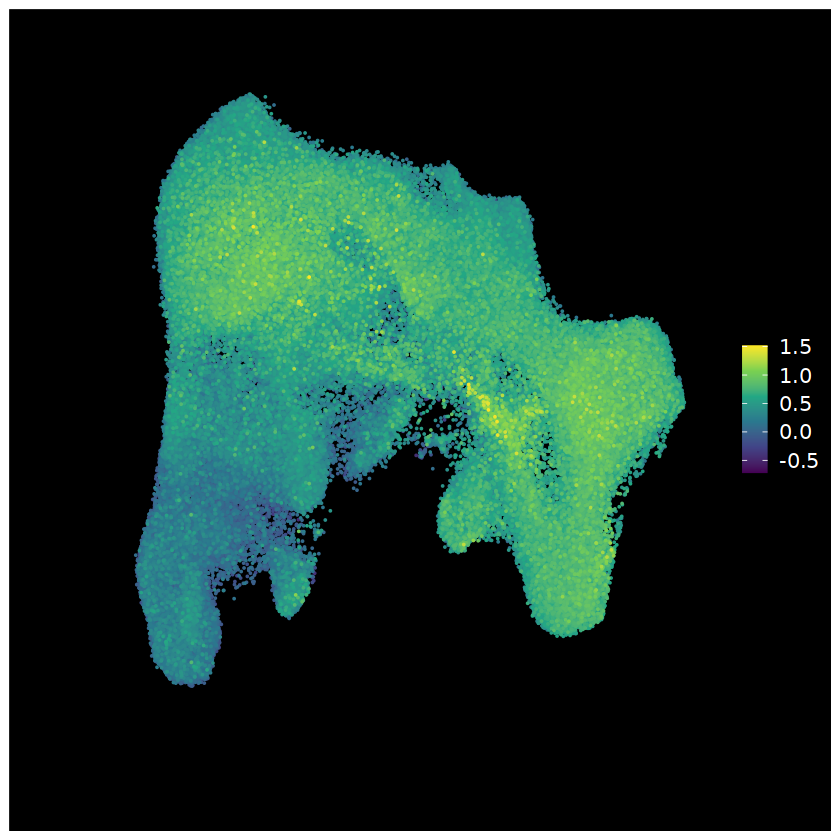

In [35]:
p <- FeaturePlot(obj_ep, features=i,raster=F,order=T)  + scale_colour_viridis_c(option="D") + 
      theme(axis.text.x = element_text(),
            axis.text.y = element_text(),  #设置 y 轴标签颜色为白色
            plot.background = element_rect(fill = "black"),   #将整个图形背景颜色改为黑色
            panel.background = element_rect(fill = "black"),  #将绘图区域背景颜色改为黑色
            panel.grid.major = element_blank(),  #隐藏主要网格线
            panel.grid.minor = element_blank(),  #隐藏次要网格线
            legend.text = element_text(color = "white")
            ) 
ggsave(paste0("/data/output/Fig2S_scRNA_ModuleScore/legend.pdf"), p)
p